In [1]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
Asset_PATH = "/home/zhimin90/DePaul/CSC695/Github/CSC695-Masters-Research-on-Neural-Network-Time-Series-Attention-Models/Asset/"

#### Timeseries windowing function

In [3]:
def window_stack(a, stepsize=1, width=52):
    n = a.shape[0]
    return np.hstack( a[i:1+n+i-width:stepsize] for i in range(0,width) )

#### Window size

In [4]:
timesteps = 52

#### Load Gaussian KDE timeseries

In [5]:
density_matrix_t_series = pickle.load(open(Asset_PATH  + 'density_matrix_t_series_25x25.pickle', 'rb'))

In [6]:
density_matrix_t_series.shape

(1011, 25, 25)

In [7]:
print(np.max(density_matrix_t_series))
print(np.min(density_matrix_t_series))

7464.852345565599
2.220446049250313e-16


In [8]:
flattened_matrix_np = np.reshape(density_matrix_t_series, 
                                 (density_matrix_t_series.shape[0],
                                  density_matrix_t_series.shape[1]*density_matrix_t_series.shape[2]))
flattened_matrix_np.shape

(1011, 625)

In [9]:
stacked = window_stack(flattened_matrix_np,1,timesteps)

/home/zhimin90/anaconda3/envs/venv/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  This is separate from the ipykernel package so we can avoid doing imports until


In [10]:
stacked.shape

(960, 32500)

In [11]:
train, valid = (60,20)
test = 20

total_len = stacked.shape[0]
train_index = range(0,int(train/100*total_len))

valid_index = range(train_index[-1]+1,train_index[-1] + int(valid/100*total_len))
test_index = range(valid_index[-1]+1,valid_index[-1] + int(test/100*total_len))

In [12]:
train_index, valid_index, test_index

(range(0, 576), range(576, 767), range(767, 958))

#### MinMax Scaler

In [13]:
scaler_max = np.max(stacked[train_index])
scaler_min = np.min(stacked[train_index])

#### We transform the whole train, valid, test based on scaler fitted on train

In [14]:
np.max(flattened_matrix_np)

7464.852345565599

In [15]:
scaled_flattened_matrix = (stacked - scaler_min)/(scaler_max - scaler_min)

In [16]:
scaled_flattened_matrix.shape

(960, 32500)

In [17]:
print(np.max(scaled_flattened_matrix))
print(np.min(scaled_flattened_matrix))

1.7283221574388663
0.0


In [18]:
scaled_flattened_matrix.shape

(960, 32500)

In [19]:
reshape_stack = scaled_flattened_matrix.reshape(scaled_flattened_matrix.shape[0],timesteps,
                                int((scaled_flattened_matrix.shape[1]/timesteps)**(1/2)),
                                int((scaled_flattened_matrix.shape[1]/timesteps)**(1/2)),1)

In [20]:
reshape_stack.shape

(960, 52, 25, 25, 1)

#### We reshape to (sample, timestep, inputshape)

In [21]:
scaled_flattened_matrix = reshape_stack
scaled_flattened_matrix.shape

(960, 52, 25, 25, 1)

#### We set the target to be 7 days aggregated KDE or 1 single frame forward

In [22]:
X_train = scaled_flattened_matrix[np.array(train_index)]
Y_train = scaled_flattened_matrix[np.array(train_index)+1][:,-1,:]
Y_train = Y_train.reshape(Y_train.shape[0],int(Y_train.shape[1]*Y_train.shape[2]*Y_train.shape[3]))

In [23]:
X_valid = scaled_flattened_matrix[np.array(valid_index)]
Y_valid = scaled_flattened_matrix[np.array(valid_index)+1][:,-1,:]
Y_valid = Y_valid.reshape(Y_valid.shape[0],int(Y_valid.shape[1]*Y_valid.shape[2]*Y_valid.shape[3]))

In [24]:
X_test = scaled_flattened_matrix[np.array(test_index)]
Y_test = scaled_flattened_matrix[np.array(test_index)+1][:,-1,:]
Y_test = Y_test.reshape(Y_test.shape[0],int(Y_test.shape[1]*Y_test.shape[2]*Y_test.shape[3]))

In [25]:
print(X_train.shape)
print(Y_train.shape)
print(X_valid.shape)
print(Y_valid.shape)
print(X_test.shape)
print(Y_test.shape)

(576, 52, 25, 25, 1)
(576, 625)
(191, 52, 25, 25, 1)
(191, 625)
(191, 52, 25, 25, 1)
(191, 625)


In [26]:
np.max(X_train)

1.0

In [27]:
np.max(X_valid)

1.345068053156236

In [28]:
np.max(X_test)

1.7283221574388663

In [67]:
import os, datetime
import tensorflow as tf
from tensorflow.keras import optimizers
import tensorflow.keras.layers as layers
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, LSTM, Bidirectional, GaussianNoise, Flatten, Dot
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Concatenate, Input, LSTM, GRU, RepeatVector, TimeDistributed
from tensorflow.keras.layers import concatenate, Activation, Permute, Multiply, Lambda, Reshape, LeakyReLU, Attention
from tensorflow.keras import backend as K


In [30]:
checkpoint_filepath = Asset_PATH+'checkpoints/'
print(checkpoint_filepath)

/home/zhimin90/DePaul/CSC695/Github/CSC695-Masters-Research-on-Neural-Network-Time-Series-Attention-Models/Asset/checkpoints/


## Benchmark

In [317]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

lr = .001
loss='mae'
METRIC_ACCURACY = 'mae'

inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))

    
timeDist = TimeDistributed(Flatten())(inputs)

LSTM_layer1 = LSTM(100, return_sequences=True)(timeDist)
#LSTM_layer2 = LSTM(1000, return_sequences=True)(LSTM_layer1)
#LSTM_layer3 = LSTM(1000, return_sequences=True)(LSTM_layer2)
LSTM_layer4 = LSTM(100)(LSTM_layer1)
#Dense1 = Dense(1000, kernel_initializer='glorot_normal', activation='relu')(LSTM_layer2)
Dense2 = Dense(Y_train.shape[1])(LSTM_layer4)
outputs = Dense2

model = Model(inputs, outputs, name="Flattened_LTSM")
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


Model: "Flattened_LTSM"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_100 (InputLayer)       [(None, 52, 25, 25, 1)]   0         
_________________________________________________________________
time_distributed_99 (TimeDis (None, 52, 625)           0         
_________________________________________________________________
lstm_137 (LSTM)              (None, 52, 100)           290400    
_________________________________________________________________
lstm_138 (LSTM)              (None, 100)               80400     
_________________________________________________________________
dense_23 (Dense)             (None, 625)               63125     
Total params: 433,925
Trainable params: 433,925
Non-trainable params: 0
_________________________________________________________________


## EN_DEC LSTM Attention

In [223]:

# Sometimes helpful to implement own softmax activation function to
# better manage calculations along specific axes.
def softmax_activation(x):
    e = K.exp(x - K.max(x, axis=1, keepdims=True))
    s = K.sum(e, axis=1, keepdims=True)
    return e / s

In [241]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))
TimeDist = TimeDistributed(Flatten())(inputs)
print(inputs.shape)
units = 100
X = LSTM(units,return_sequences=True)(TimeDist)
X = LSTM(units,return_sequences=True)(X)
print(X.shape)
X = Reshape((time_step, units))(X)
print(X.shape)
h_start = Input(shape=(units,), name='h_start')
print("h_start.shape:",h_start.shape)
c_start = Input(shape=(units,), name='c_start')
h_prev = h_start
c_prev = c_start
#output is a single timestep
h_prev_repeat = RepeatVector(time_step)(h_prev)
joined = Concatenate(axis=-1)([X, h_prev_repeat])
print(joined.shape)
joined = Dense(joined.shape[2], name=f'attention_mid_dense')(joined)
print(joined.shape)
e_vals = Dense(1, name=f'attention_final_dense')(joined)
print(e_vals.shape)
alphas = Activation(softmax_activation, name=f'attention_softmax')(e_vals)
print("alphas.shape", alphas.shape)
print("X.shape", X.shape)
attentions = Dot(axes=1)([alphas, X])
#attended_LSTM_out = Lambda(lambda x : K.sum(x, axis=1))(attentions) ## this line
#print(attended_LSTM_out.shape)

h_prev, _, c_prev = LSTM(units, return_state=True,name='layer_2_LSTM')(attentions, initial_state=[h_prev, c_prev])
outputs = Dense(Y_train.shape[1],activation='linear', name='dense_output')(h_prev)


model = Model(inputs=[inputs, h_start, c_start], outputs=outputs, name='EN_DEC_LSTM_ATTENTION')
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)



(None, 52, 25, 25, 1)
(None, 52, 100)
(None, 52, 100)
h_start.shape: (None, 100)
(None, 52, 200)
(None, 52, 200)
(None, 52, 1)
alphas.shape (None, 52, 1)
X.shape (None, 52, 100)
Model: "EN_DEC_LSTM_ATTENTION"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_73 (InputLayer)           [(None, 52, 25, 25,  0                                            
__________________________________________________________________________________________________
time_distributed_72 (TimeDistri (None, 52, 625)      0           input_73[0][0]                   
__________________________________________________________________________________________________
lstm_91 (LSTM)                  (None, 52, 100)      290400      time_distributed_72[0][0]        
__________________________________________________________________________________________________

In [302]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))
TimeDist = TimeDistributed(Flatten())(inputs)
print(inputs.shape)
units = 50
factor = 1
X = LSTM(units,return_sequences=True)(TimeDist)
print(X.shape)
X = Reshape((time_step, units))(X)
print(X.shape)
h_start = Input(shape=(units*factor,), name='h_start')
print("h_start.shape:",h_start.shape)
c_start = Input(shape=(units*factor,), name='c_start')
h_prev = h_start
c_prev = c_start
#output is a single timestep
h_prev_repeat = RepeatVector(time_step)(h_prev)
joined = Concatenate(axis=-1)([X, h_prev_repeat])
print(joined.shape)
joined = Dense(joined.shape[2], name=f'attention_mid_dense')(joined)
print(joined.shape)
e_vals = Dense(1, name=f'attention_final_dense')(joined)
print(e_vals.shape)
alphas = Activation(softmax_activation, name=f'attention_softmax')(e_vals)
print("alphas.shape", alphas.shape)
print("X.shape", X.shape)
attentions = Dot(axes=1)([alphas, X])
print(attentions.shape)

h_prev, _, c_prev = LSTM(units*factor, return_state=True,name='layer_2_LSTM')(attentions, initial_state=[h_prev, c_prev])
print("h_prev.shape", h_prev.shape)
outputs = Dense(Y_train.shape[1],activation='linear', name='dense_output')(h_prev)
print(outputs.shape)
model = Model(inputs=[inputs, h_start, c_start], outputs=outputs, name='EN_DEC_LSTM_ATTENTION')
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)


(None, 52, 25, 25, 1)
(None, 52, 50)
(None, 52, 50)
h_start.shape: (None, 50)
(None, 52, 100)
(None, 52, 100)
(None, 52, 10)
alphas.shape (None, 52, 10)
X.shape (None, 52, 50)
(None, 10, 50)
h_prev.shape (None, 50)
(None, 625)
Model: "EN_DEC_LSTM_ATTENTION"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_96 (InputLayer)           [(None, 52, 25, 25,  0                                            
__________________________________________________________________________________________________
time_distributed_95 (TimeDistri (None, 52, 625)      0           input_96[0][0]                   
__________________________________________________________________________________________________
lstm_133 (LSTM)                 (None, 52, 50)       135200      time_distributed_95[0][0]        
_________________________________________________

## Encoder Decoder

In [322]:
serie_size, time_step, n_features_row, n_features_column, no_channel = X_train.shape

inputs = Input(shape=(time_step,n_features_row, n_features_column, no_channel))
TimeDist = TimeDistributed(Flatten())(inputs)
print(inputs.shape)
units = 100
factor = 1
X = LSTM(units,return_sequences=True)(TimeDist)
print(X.shape)
X = Reshape((time_step, units))(X)
print(X.shape)
h_start = Input(shape=(units*factor,), name='h_start')
print("h_start.shape:",h_start.shape)
c_start = Input(shape=(units*factor,), name='c_start')
h_prev = h_start
c_prev = c_start

h_prev, _, c_prev = LSTM(units*factor, return_state=True,name='layer_2_LSTM')(X, initial_state=[h_prev, c_prev])
print("h_prev.shape", h_prev.shape)
outputs = Dense(Y_train.shape[1],activation='linear', name='dense_output')(h_prev)
print(outputs.shape)
model = Model(inputs=[inputs, h_start, c_start], outputs=outputs, name='EN_DEC_LSTM_ATTENTION')
model.summary()

adam = optimizers.Adam(lr)
model.compile(loss='mean_absolute_error',
                   metrics=['mae'], 
                   optimizer=adam)

(None, 52, 25, 25, 1)
(None, 52, 100)
(None, 52, 100)
h_start.shape: (None, 100)
h_prev.shape (None, 100)
(None, 625)
Model: "EN_DEC_LSTM_ATTENTION"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_101 (InputLayer)          [(None, 52, 25, 25,  0                                            
__________________________________________________________________________________________________
time_distributed_100 (TimeDistr (None, 52, 625)      0           input_101[0][0]                  
__________________________________________________________________________________________________
lstm_139 (LSTM)                 (None, 52, 100)      290400      time_distributed_100[0][0]       
__________________________________________________________________________________________________
reshape_86 (Reshape)            (None, 52, 100)      0     

## ---------------------> Run fit on any of the previous model here <--------------------------

In [323]:
h_start = np.zeros((X_train.shape[0], units*factor))
c_start = np.zeros((X_train.shape[0], units*factor))
h_startv = np.zeros((X_valid.shape[0], units*factor))
c_startv = np.zeros((X_valid.shape[0], units*factor))

In [328]:
EPOCHS = 5

earlystop_callback = tf.keras.callbacks.EarlyStopping(monitor="val_loss",
    min_delta=0,
    patience=EPOCHS*10,
    verbose=1,
    mode="auto",
    baseline=None,
    restore_best_weights=True,)

logdir = os.path.join("./logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
tensorboard_cbk = tf.keras.callbacks.TensorBoard(log_dir=logdir)

modelfilename = checkpoint_filepath + '_'+\
                    datetime.datetime.now().strftime("%Y%m%d-%H%M%S")\
                    + "_model.hdf5"

model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    modelfilename,
    save_weights_only=False,
    monitor='val_loss',#'val_accuracy',
    mode='min',
    verbose=1,
    period = 1,
    save_best_only=True)


model.summary()



model_history = model.fit(x=[X_train,h_start, c_start],y=Y_train, 
                             validation_data=([X_valid,h_startv, c_startv], Y_valid),
                             epochs=500, 
                             batch_size=21,
                             shuffle=True,
                             callbacks=[tensorboard_cbk,
                             #hp.KerasCallback(logdir, hparams),
                             earlystop_callback,
                             model_checkpoint_callback
                                       ])

valid_loss, valid_acc = model.evaluate([X_valid,h_startv, c_startv], Y_valid, verbose=2) # 5/2020 nt: use validation set
print ("valid_accuracy_MAE=%s, valid_loss=%s" % (valid_acc, valid_loss))

test_loss, test_acc = model.evaluate([X_test,h_startv, c_startv], Y_test, verbose=2) # 5/2020 nt: use validation set
print ("test_accuracy_MAE=%s, test_loss=%s" % (test_acc, test_loss))

Model: "EN_DEC_LSTM_ATTENTION"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_101 (InputLayer)          [(None, 52, 25, 25,  0                                            
__________________________________________________________________________________________________
time_distributed_100 (TimeDistr (None, 52, 625)      0           input_101[0][0]                  
__________________________________________________________________________________________________
lstm_139 (LSTM)                 (None, 52, 100)      290400      time_distributed_100[0][0]       
__________________________________________________________________________________________________
reshape_86 (Reshape)            (None, 52, 100)      0           lstm_139[0][0]                   
______________________________________________________________________________

546/576 [===========================>..] - ETA: 0s - loss: 0.0024 - mae: 0.0024
Epoch 00019: val_loss did not improve from 0.00451
576/576 [==============================] - 0s 601us/sample - loss: 0.0024 - mae: 0.0024 - val_loss: 0.0045 - val_mae: 0.0045
Epoch 20/500
567/576 [============================>.] - ETA: 0s - loss: 0.0024 - mae: 0.0024
Epoch 00020: val_loss improved from 0.00451 to 0.00450, saving model to /home/zhimin90/DePaul/CSC695/Github/CSC695-Masters-Research-on-Neural-Network-Time-Series-Attention-Models/Asset/checkpoints/_20200723-214231_model.hdf5
576/576 [==============================] - 0s 655us/sample - loss: 0.0024 - mae: 0.0024 - val_loss: 0.0045 - val_mae: 0.0045
Epoch 21/500
525/576 [==========================>...] - ETA: 0s - loss: 0.0024 - mae: 0.0024
Epoch 00021: val_loss did not improve from 0.00450
576/576 [==============================] - 0s 652us/sample - loss: 0.0024 - mae: 0.0024 - val_loss: 0.0045 - val_mae: 0.0045
Epoch 22/500
546/576 [==========

483/576 [========================>.....] - ETA: 0s - loss: 0.0023 - mae: 0.0023
Epoch 00048: val_loss did not improve from 0.00449
576/576 [==============================] - 0s 587us/sample - loss: 0.0023 - mae: 0.0023 - val_loss: 0.0046 - val_mae: 0.0046
Epoch 49/500
567/576 [============================>.] - ETA: 0s - loss: 0.0023 - mae: 0.0023
Epoch 00049: val_loss did not improve from 0.00449
576/576 [==============================] - 0s 601us/sample - loss: 0.0023 - mae: 0.0023 - val_loss: 0.0046 - val_mae: 0.0046
Epoch 50/500
462/576 [=======================>......] - ETA: 0s - loss: 0.0023 - mae: 0.0023
Epoch 00050: val_loss did not improve from 0.00449
576/576 [==============================] - 0s 596us/sample - loss: 0.0023 - mae: 0.0023 - val_loss: 0.0045 - val_mae: 0.0045
Epoch 51/500
567/576 [============================>.] - ETA: 0s - loss: 0.0023 - mae: 0.0023
Epoch 00051: val_loss did not improve from 0.00449
576/576 [==============================] - 0s 594us/sample - l

Epoch 79/500
504/576 [=========================>....] - ETA: 0s - loss: 0.0022 - mae: 0.0022
Epoch 00079: val_loss did not improve from 0.00449
576/576 [==============================] - 0s 581us/sample - loss: 0.0022 - mae: 0.0022 - val_loss: 0.0046 - val_mae: 0.0046
Epoch 80/500
504/576 [=========================>....] - ETA: 0s - loss: 0.0022 - mae: 0.0022
Epoch 00080: val_loss did not improve from 0.00449
576/576 [==============================] - 0s 571us/sample - loss: 0.0022 - mae: 0.0022 - val_loss: 0.0045 - val_mae: 0.0045
Epoch 81/500
462/576 [=======================>......] - ETA: 0s - loss: 0.0022 - mae: 0.0022
Epoch 00081: val_loss did not improve from 0.00449
576/576 [==============================] - 0s 582us/sample - loss: 0.0022 - mae: 0.0022 - val_loss: 0.0046 - val_mae: 0.0046
Epoch 82/500
483/576 [========================>.....] - ETA: 0s - loss: 0.0022 - mae: 0.0022
Epoch 00082: val_loss did not improve from 0.00449
576/576 [==============================] - 0s 586

## LSTM

In [251]:
test_loss, test_acc = model.evaluate([X_test,h_startv, c_startv], Y_test, verbose=2) # 5/2020 nt: use validation set
print ("test_accuracy_MAE=%s, test_loss=%s" % (test_acc, test_loss))

191/191 - 0s - loss: 0.0071 - mae: 0.0071
test_accuracy_MAE=0.0071155345, test_loss=0.007115534845622578


## EN_DEC LSTM + Attention

In [308]:
test_loss, test_acc = model.evaluate([X_test,h_startv, c_startv], Y_test, verbose=2) # 5/2020 nt: use validation set
print ("test_accuracy_MAE=%s, test_loss=%s" % (test_acc, test_loss))

191/191 - 0s - loss: 0.0072 - mae: 0.0072
test_accuracy_MAE=0.0072214953, test_loss=0.007221495420598859


## Validation set result 25x25 pixels

#### Flattened_Fully_Connected: valid_accuracy_MAE=0.0067913793, valid_loss=0.006791379331996304

#### Flattened_LTSM: valid_accuracy_MAE=0.004592653, valid_loss=0.004592652776380952

#### 2DCNN_LTSM: valid_accuracy_MAE=0.0053498237, valid_loss=0.005349824231859121

#### FLATTENED_LTSM_Attention: valid_accuracy_MAE=0.005595601, valid_loss=0.005595600854176345

#### Flattened_Attention_Time: valid_accuracy_MAE=0.0058029336, valid_loss=0.0058029338117708395

#### Attention_FFT: valid_accuracy_MAE=0.0062100464, valid_loss=0.00621004617426798

#### Attention_Time_FFT_STFT: valid_accuracy_MAE=0.0058276486, valid_loss=0.005827648562735132

#### TimeDistributed_attention: valid_accuracy_MAE=0.006259729, valid_loss=0.006259729208044356

#### TimeDistributed_attention1_plus_attention2_on_time: valid_accuracy_MAE=0.006148583, valid_loss=0.006148582597443571

#### 2 headed TimeDistributed_attention1_plus_attention2_on_time: valid_accuracy_MAE=0.0058226553, valid_loss=0.005822655369395985

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
logs_base_dir = "./logs"
os.makedirs(logs_base_dir, exist_ok=True)
%tensorboard --logdir {logs_base_dir}

In [148]:
Predict = model.predict([X_valid,h_startv, c_startv])

In [149]:
def reshapePred(Predict, fromLast=1):
    return np.rot90(Predict[-1*fromLast].reshape(int(Predict[-1*fromLast].shape[0]**(1/2)),int(Predict[-1*fromLast].shape[0]**(1/2))))

In [150]:
vmax, vmin = np.max(Predict),np.min(Predict)
vmax, vmin

(0.9415091, -0.004546633)

In [151]:
dvmax, dvmin = np.max(np.abs(Predict-Y_valid)),np.min(np.abs(Predict-Y_valid))
dvmax, dvmin

(0.46981318369517644, 1.1932570487260818e-08)

In [152]:
diff_max,diff_min = (dvmax , dvmin ) 
def scaleDiff(diff,diff_max,diff_min):
    return (diff - diff_min)/(diff_max - diff_min)

#### We chart autocorrelation

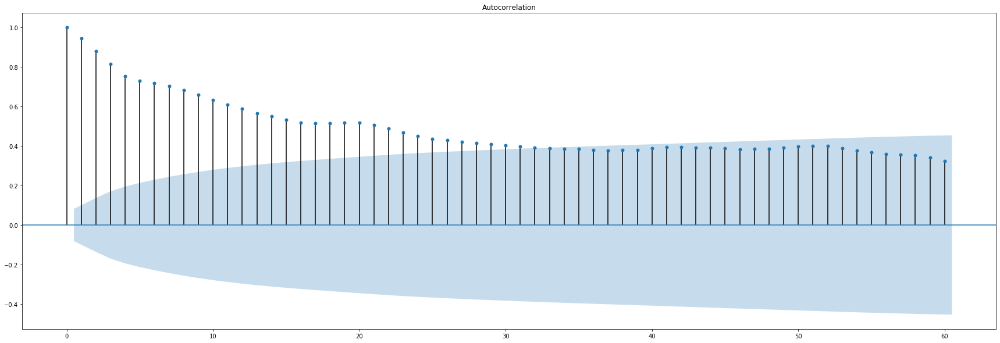

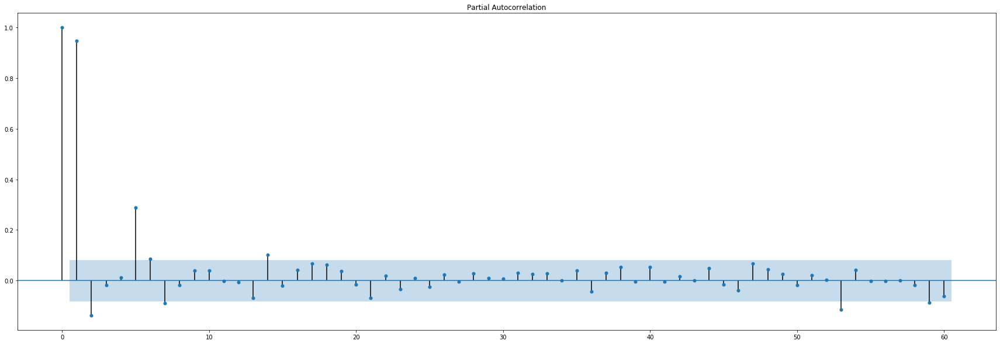

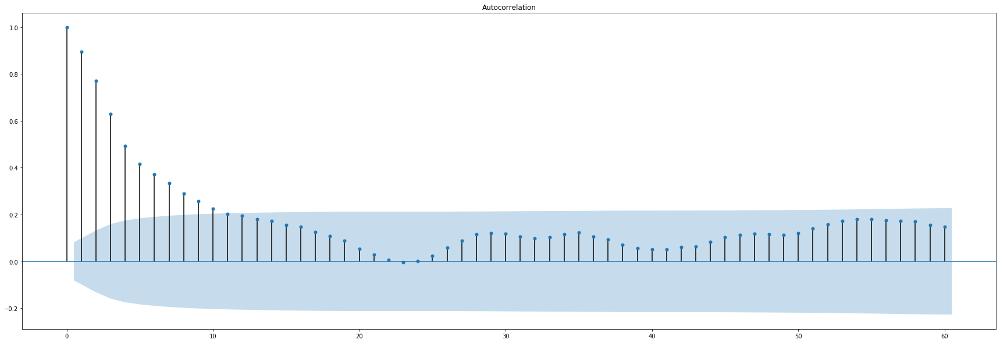

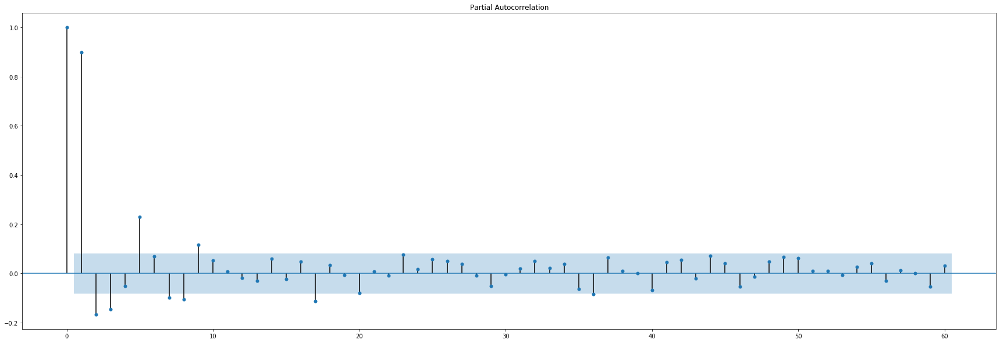

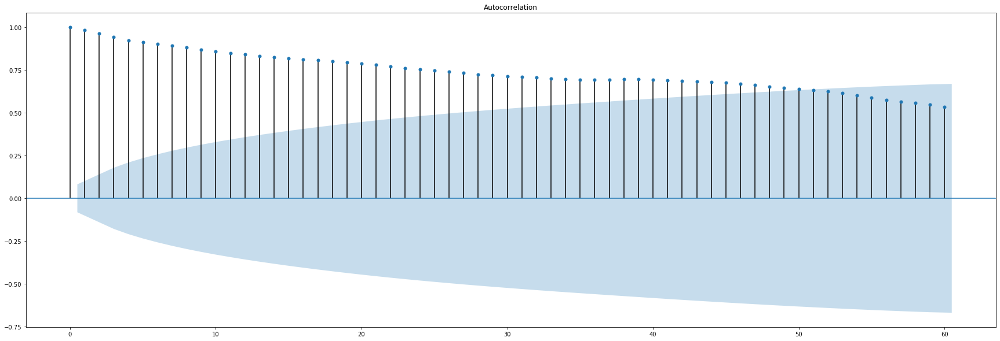

...

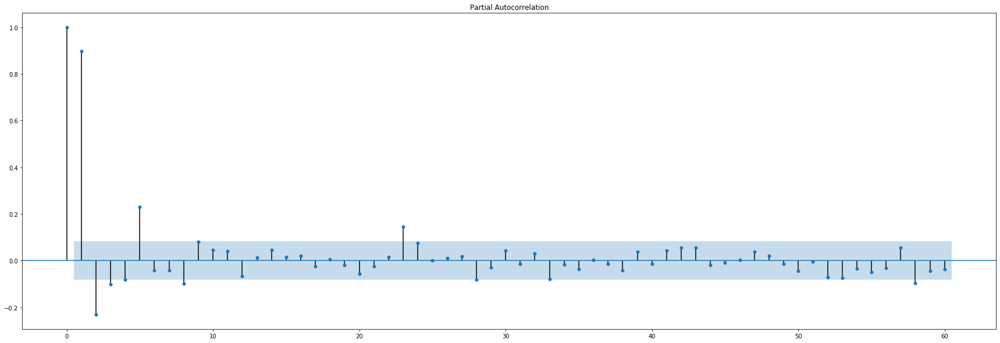

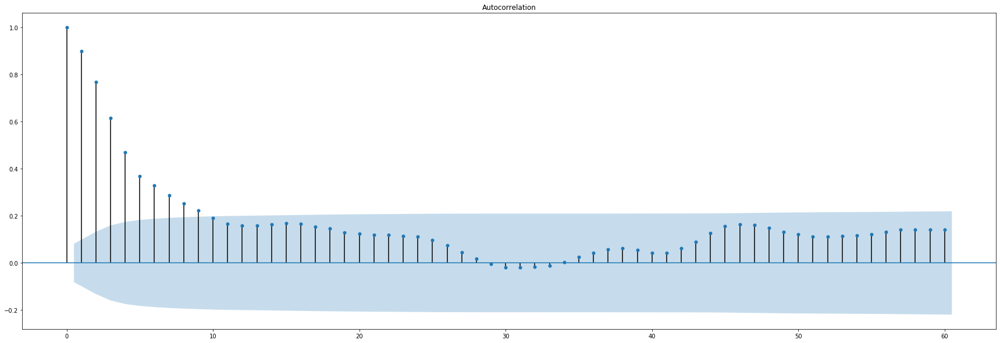

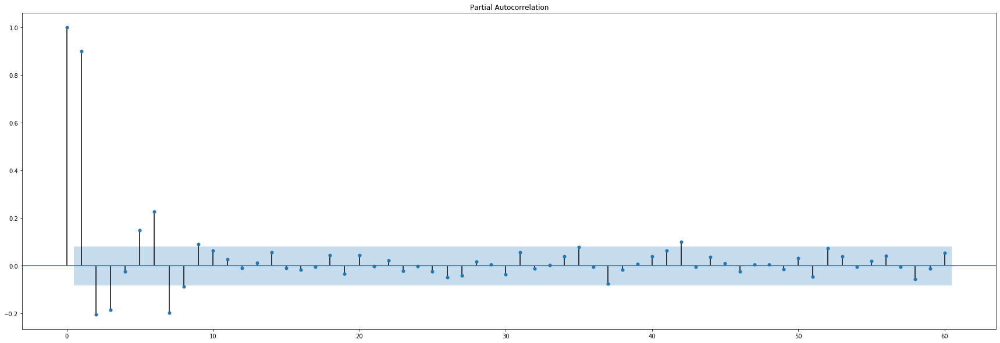

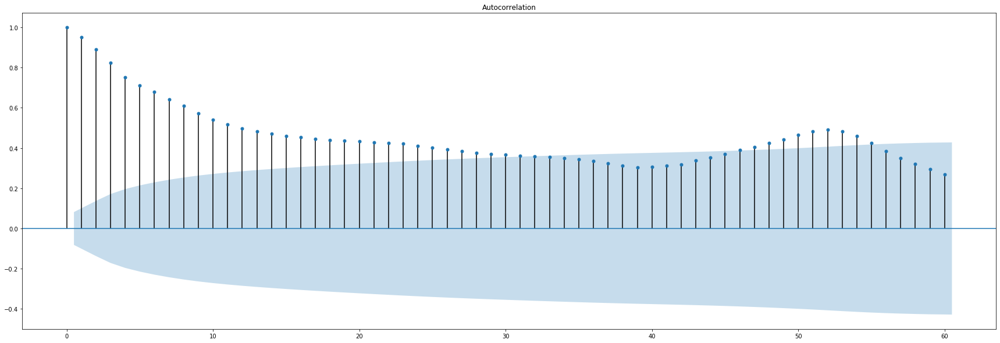

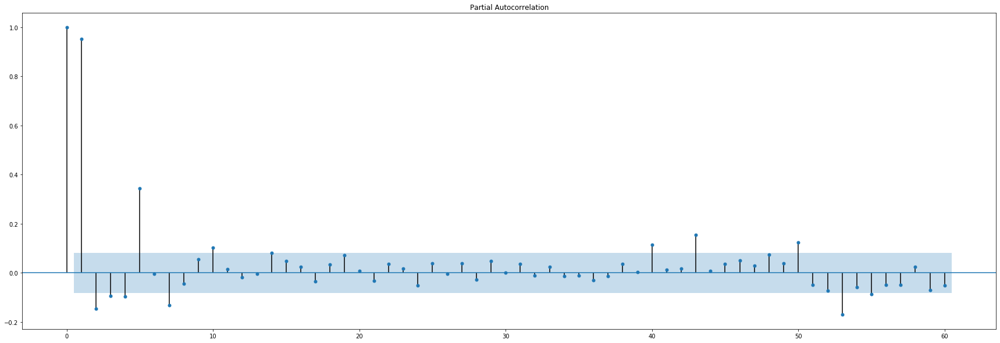

In [153]:
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf
import matplotlib as mpl

for i in np.argsort(Y_train)[:,-10:][0]:
    series = pd.DataFrame(np.transpose(np.vstack([Y_train[:,i]])),columns=["Y_train"])
    with mpl.rc_context():
        mpl.rc("figure", figsize=(30,10))
        plot_acf(series,lags=60)
        plot_pacf(series,lags=60)

#### Benchmark prediction

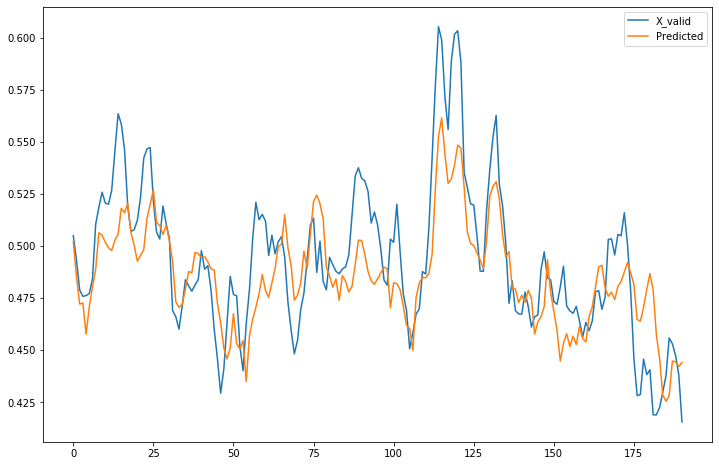

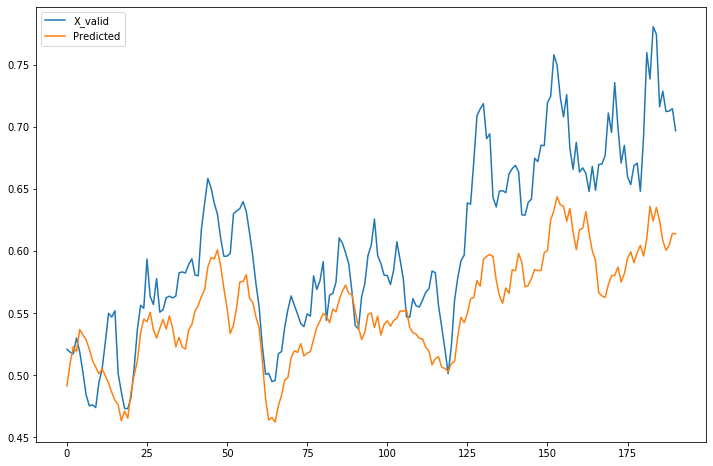

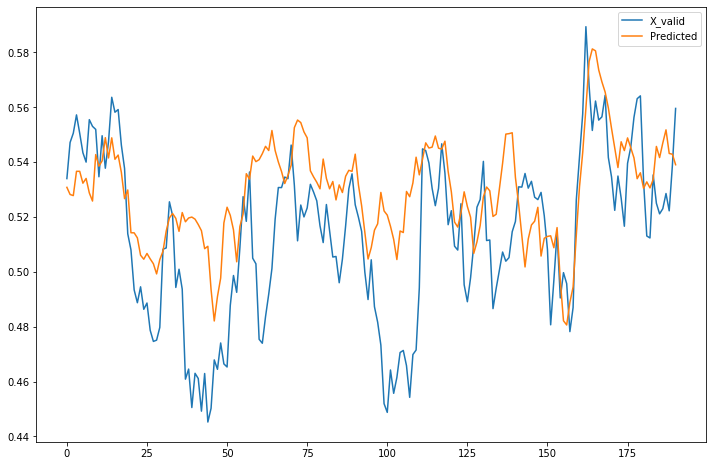

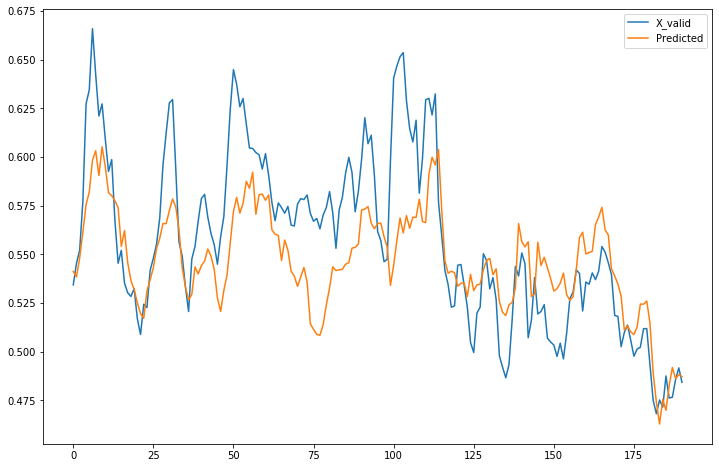

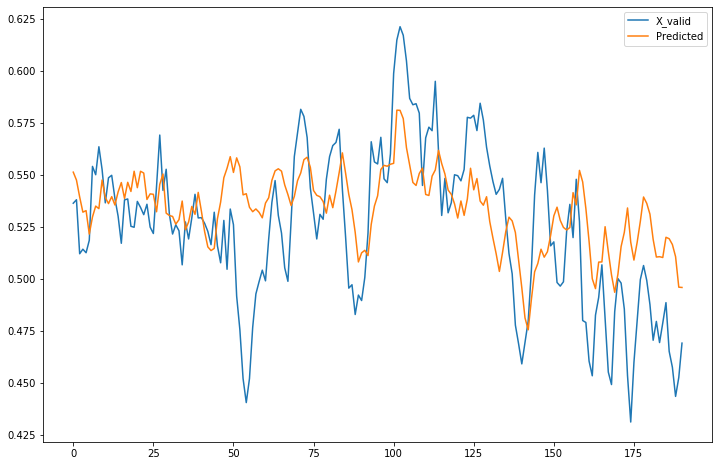

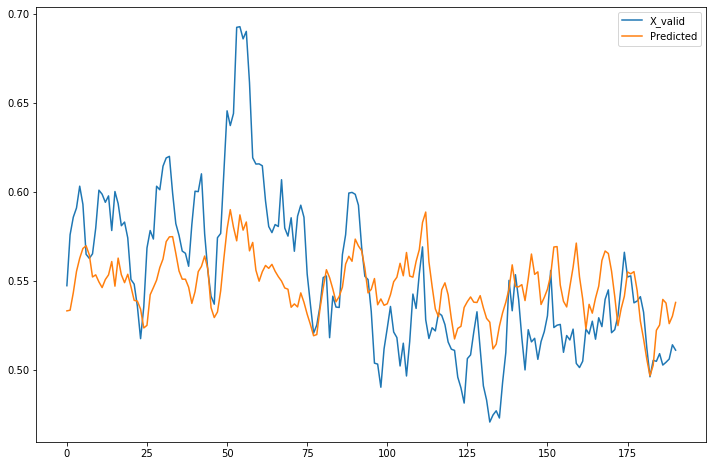

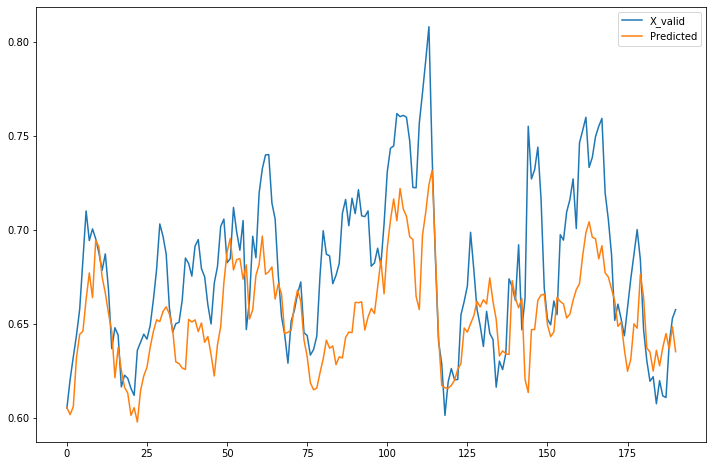

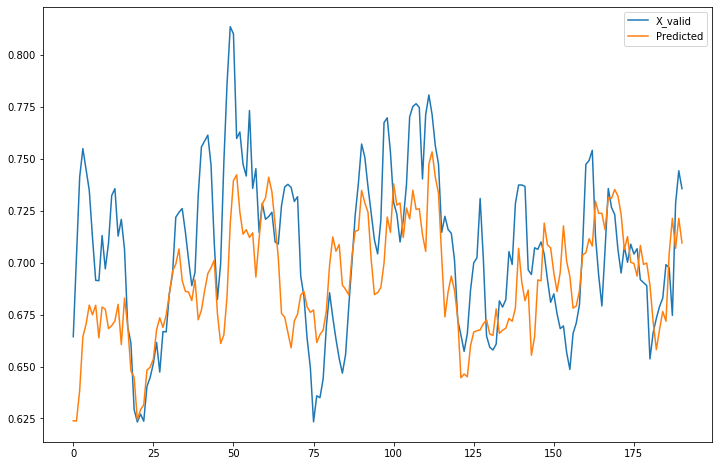

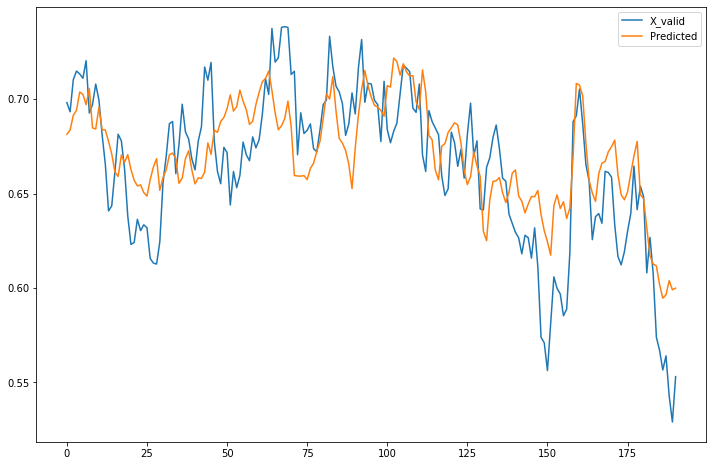

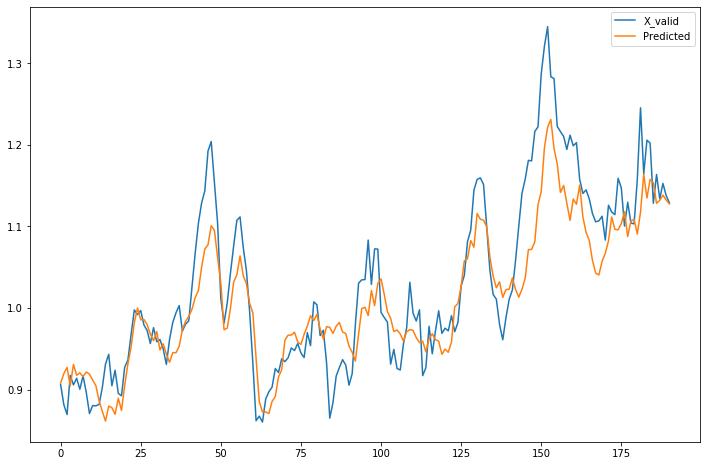

In [252]:
Predict = model.predict([X_valid,h_startv, c_startv])
for i in np.argsort(Y_valid)[:,-10:][0]:
    pd.DataFrame(np.transpose(np.vstack([Y_valid[:,i],Predict[:,i]])),columns=["X_valid","Predicted"]).plot(figsize=(12,8))

#### ENC_LSTM LSTM Attention

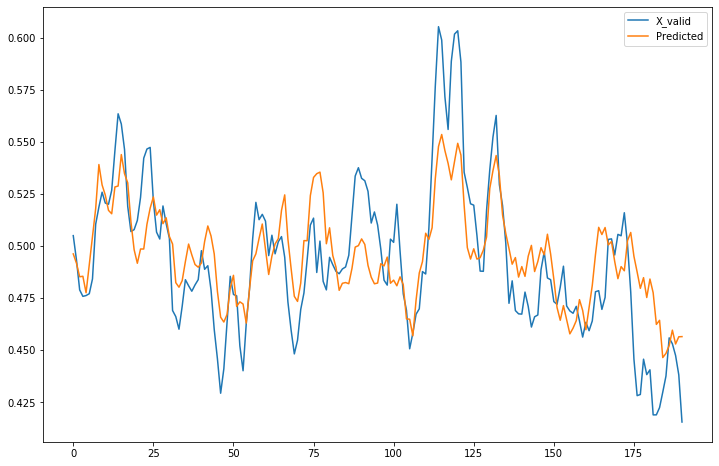

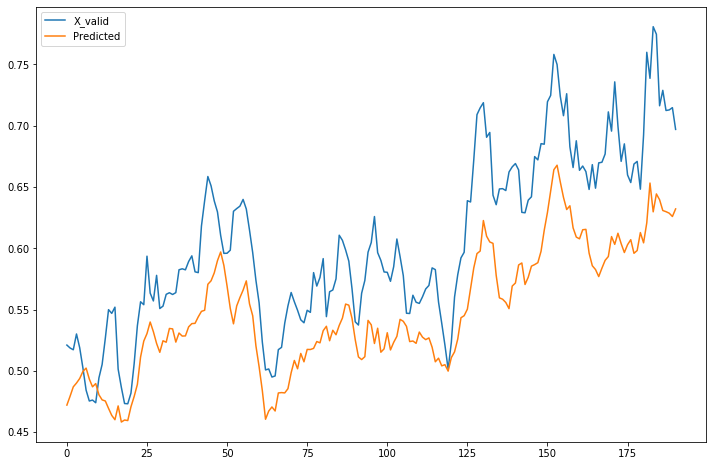

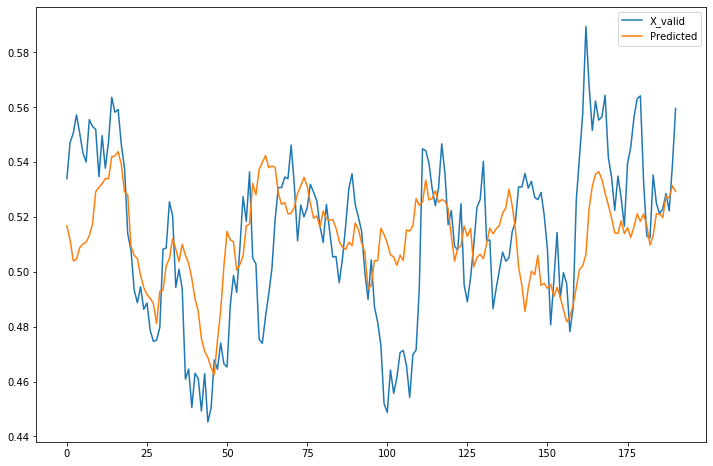

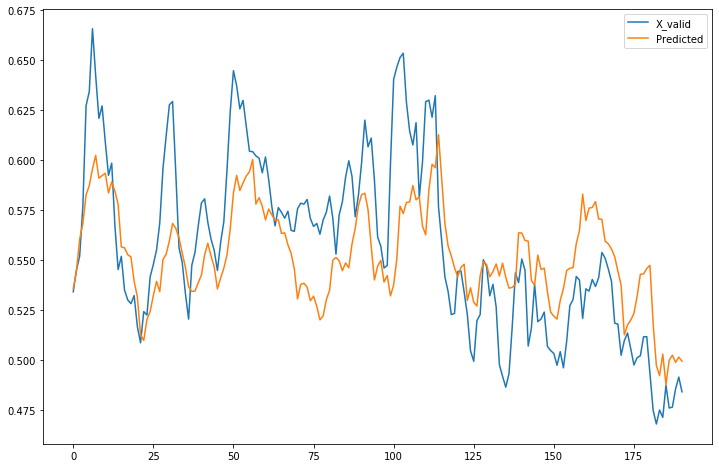

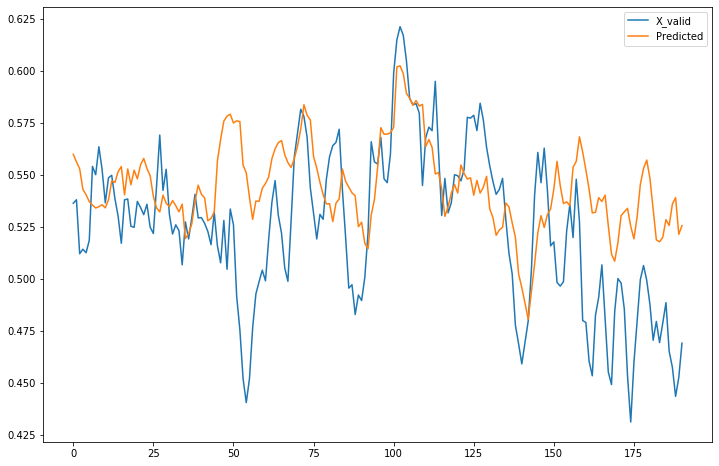

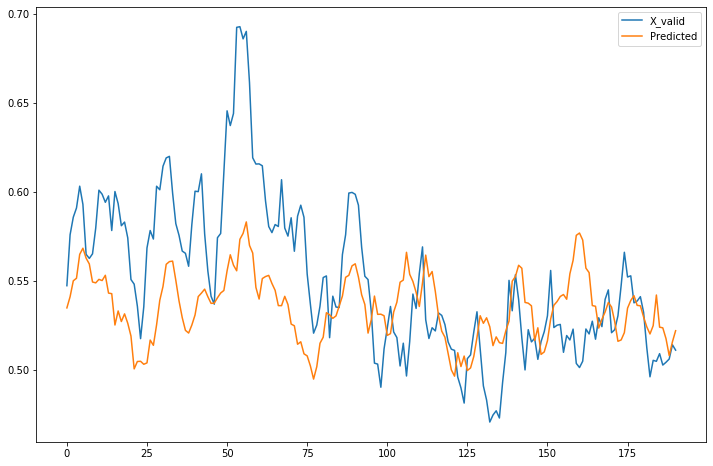

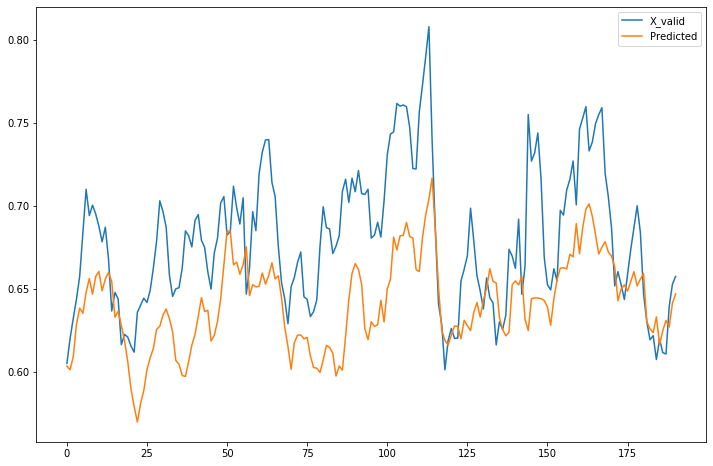

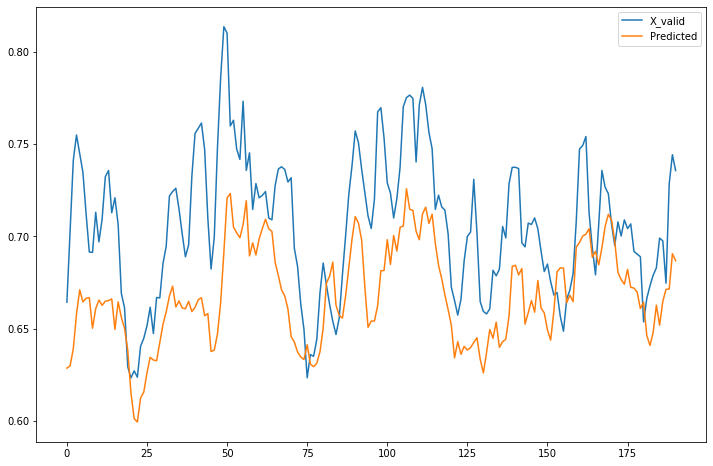

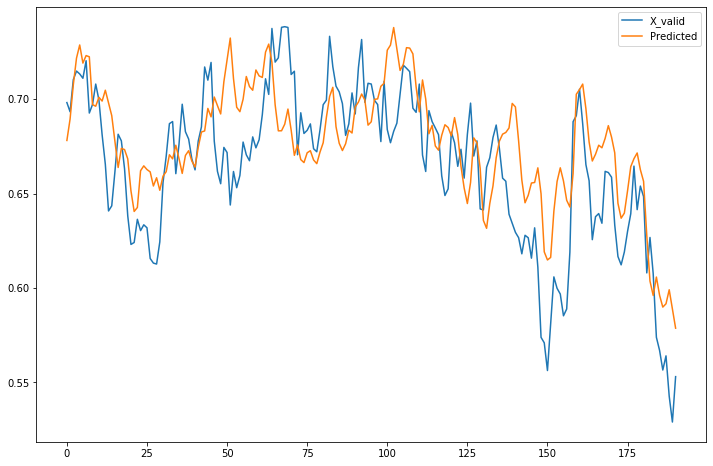

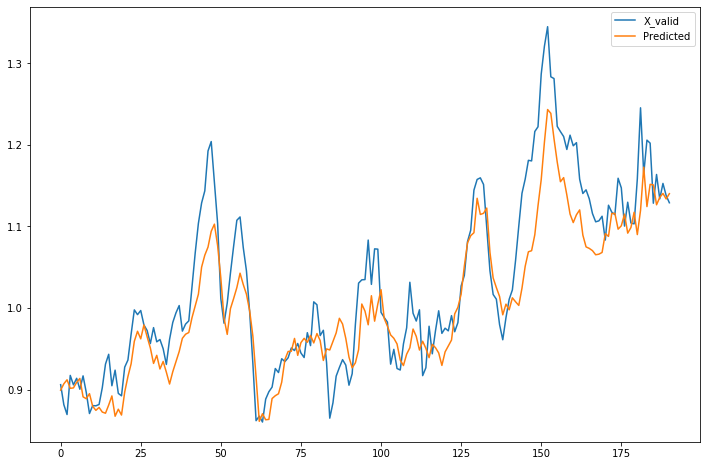

In [325]:
Predict = model.predict([X_valid,h_startv, c_startv])
for i in np.argsort(Y_valid)[:,-10:][0]:
    pd.DataFrame(np.transpose(np.vstack([Y_valid[:,i],Predict[:,i]])),columns=["X_valid","Predicted"]).plot(figsize=(12,8))

/home/zhimin90/anaconda3/envs/venv/lib/python3.7/site-packages/ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
/home/zhimin90/anaconda3/envs/venv/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  from ipykernel import kernelapp as app
/home/zhimin90/anaconda3/envs/venv/lib/python3.7/site-packages/ipykernel_launcher.py:20: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explic

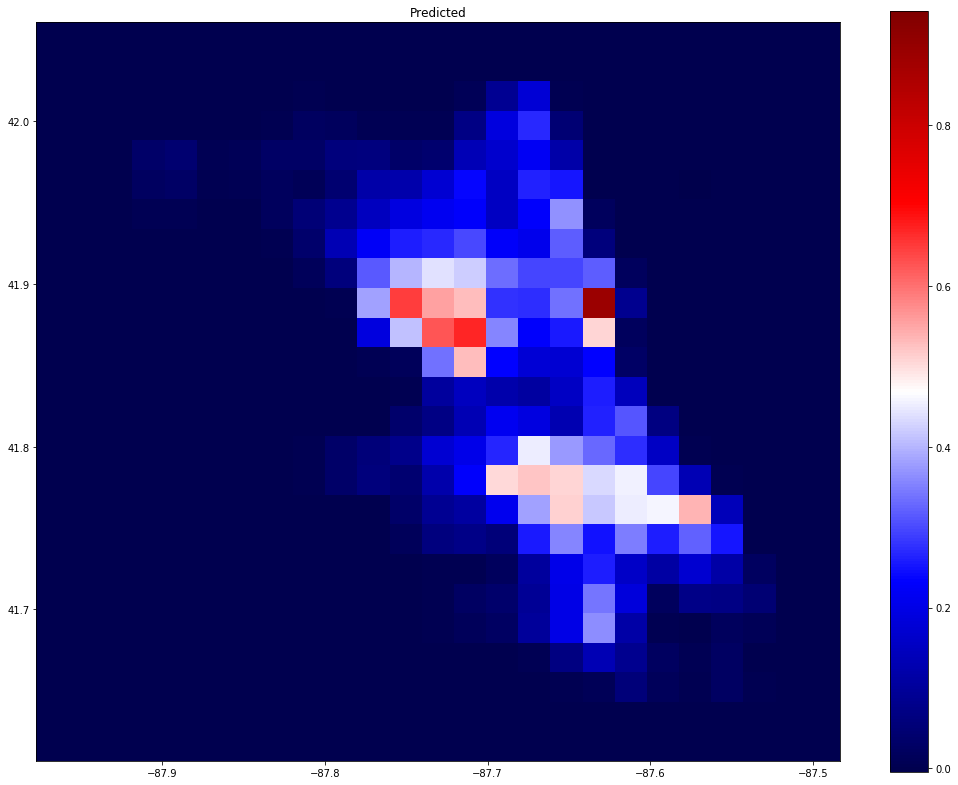

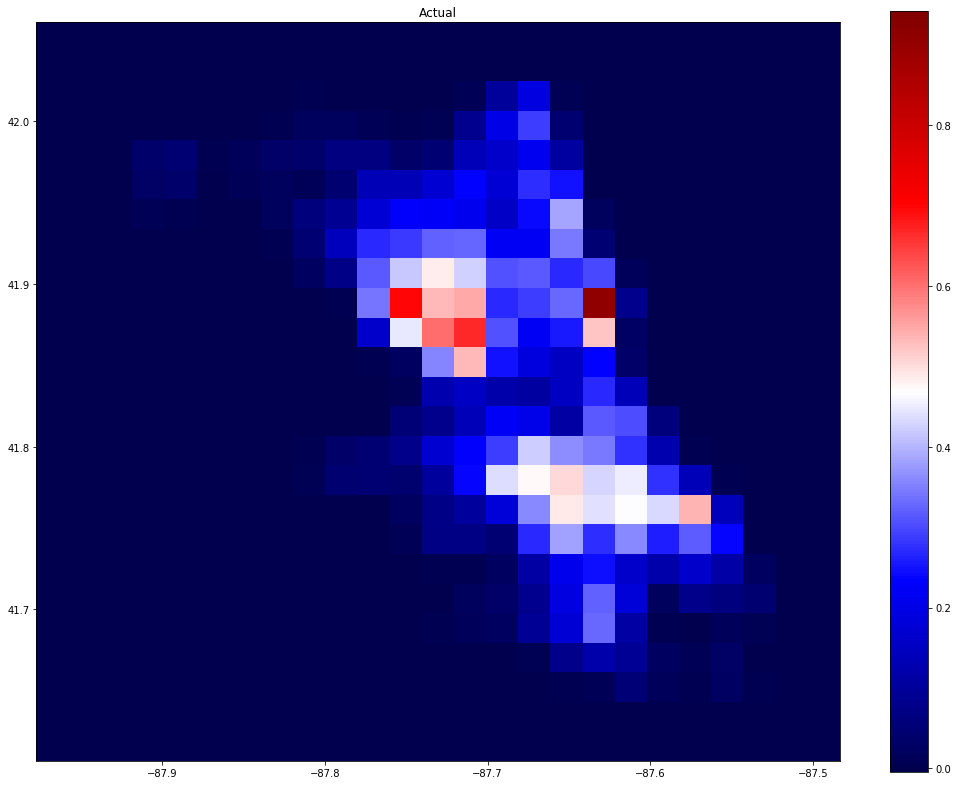

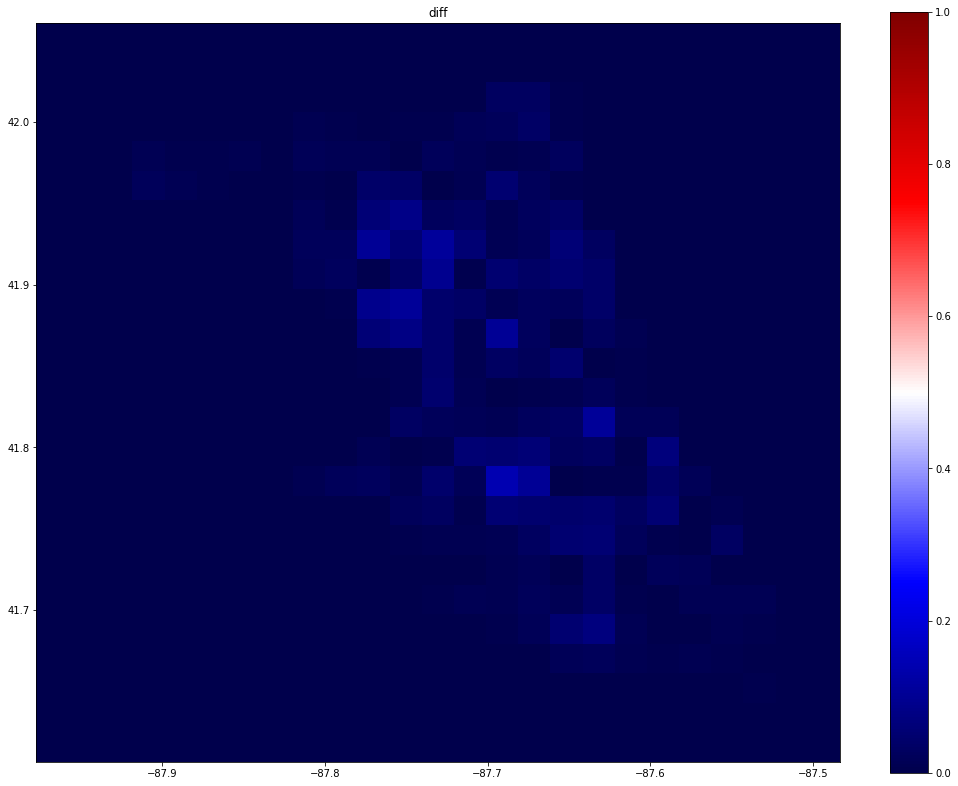

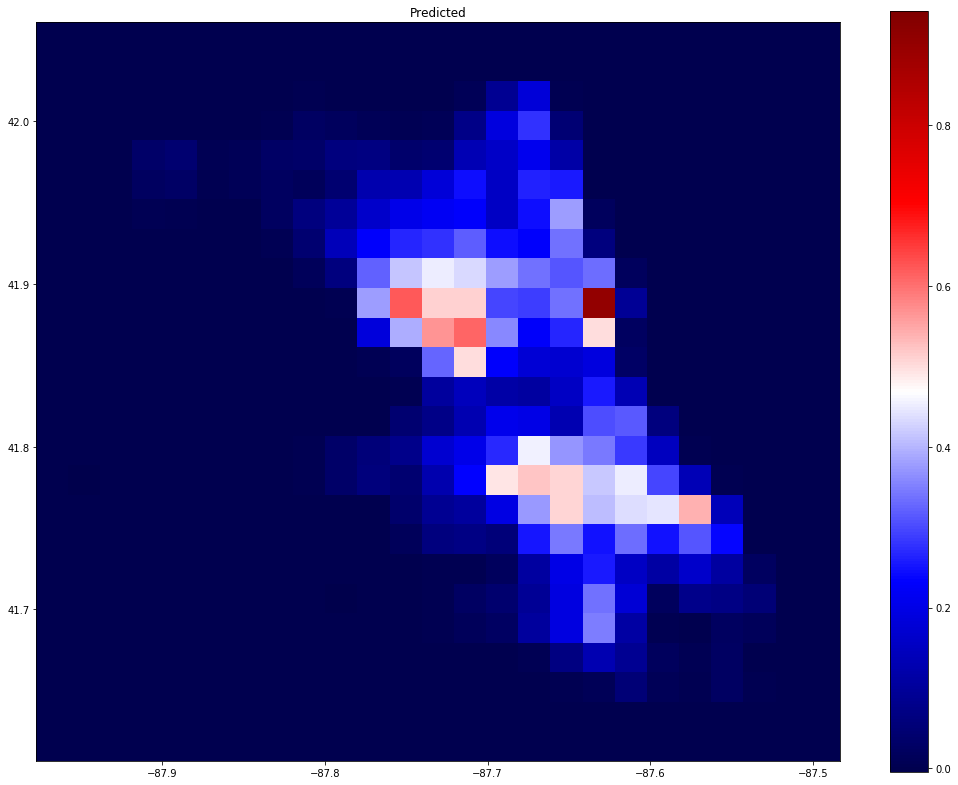

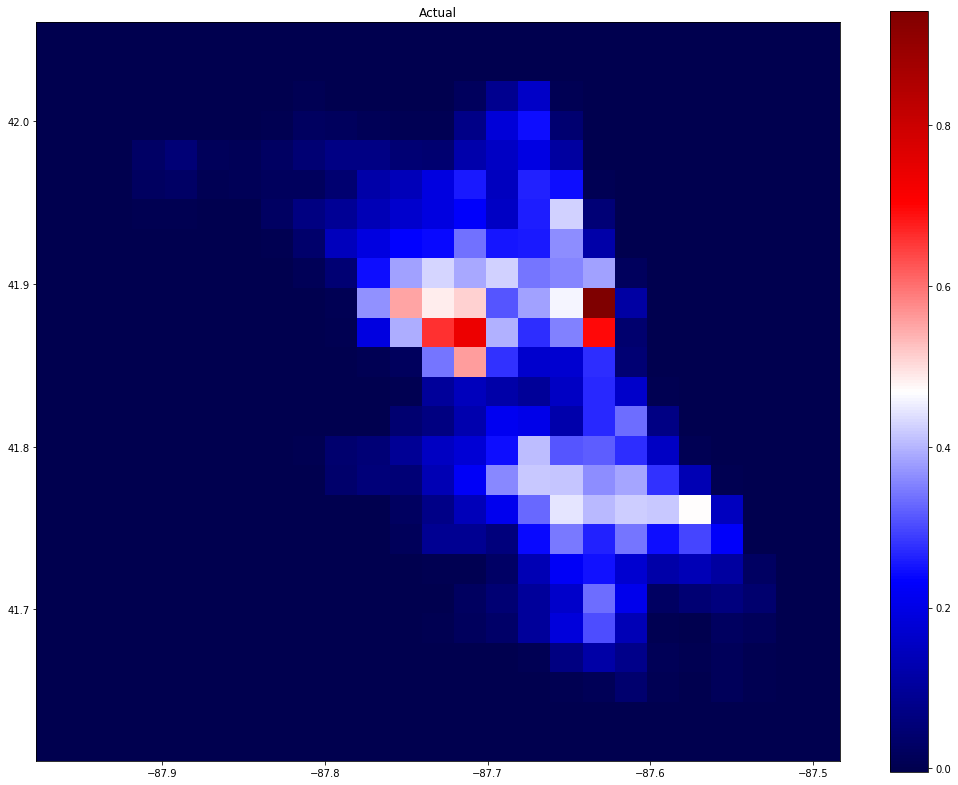

...

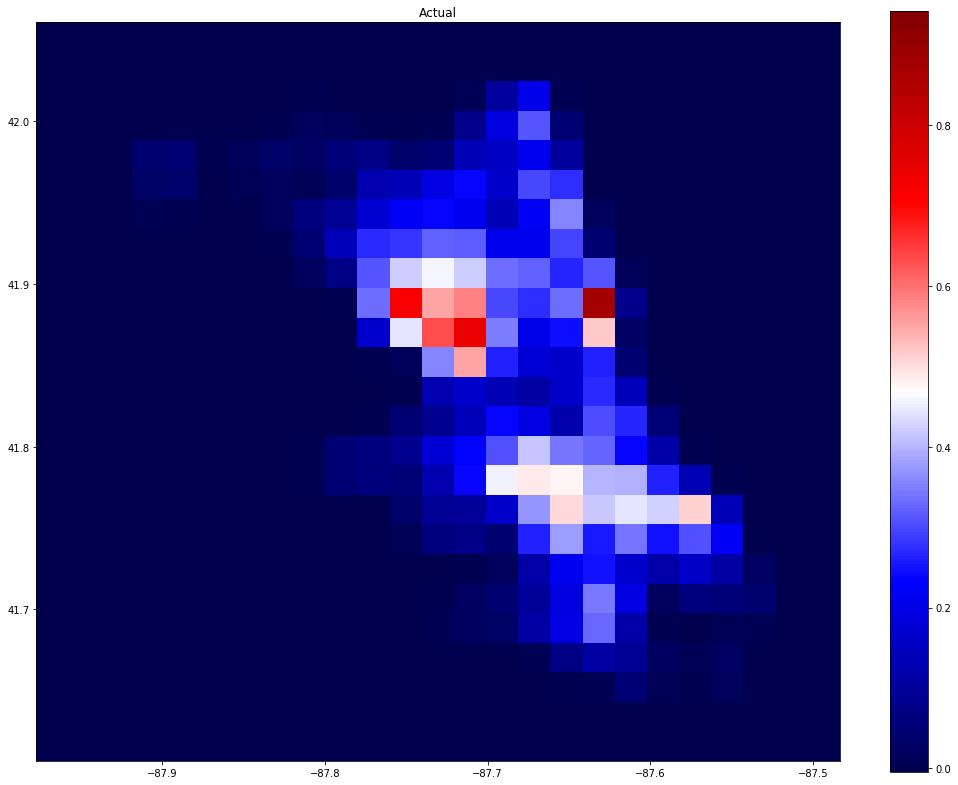

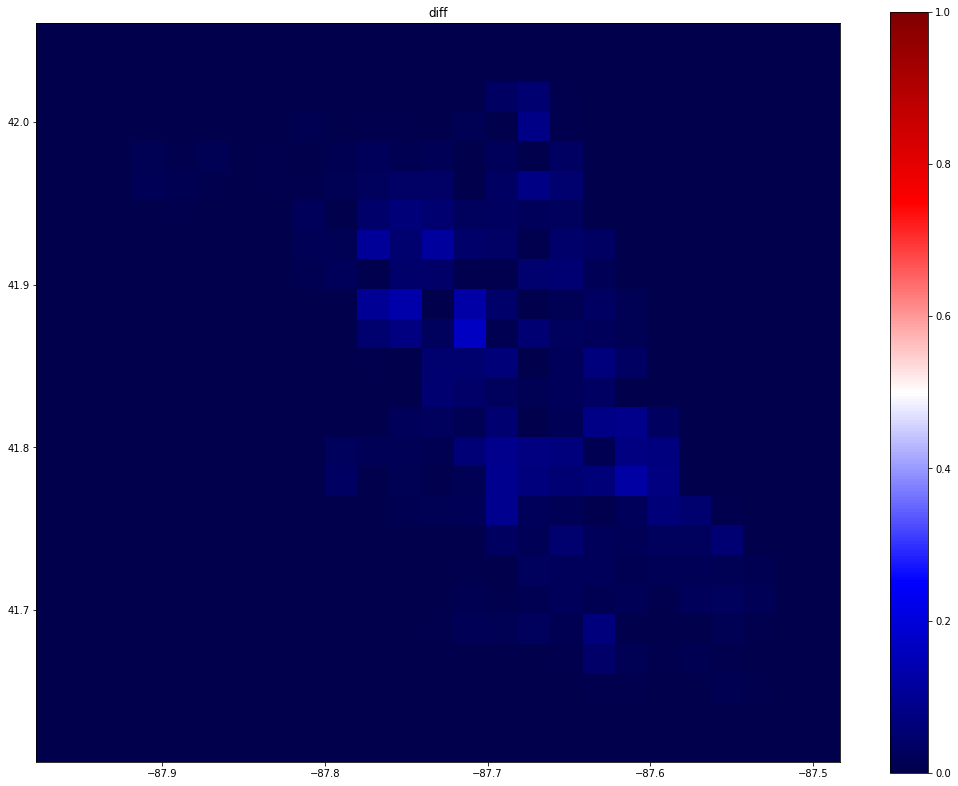

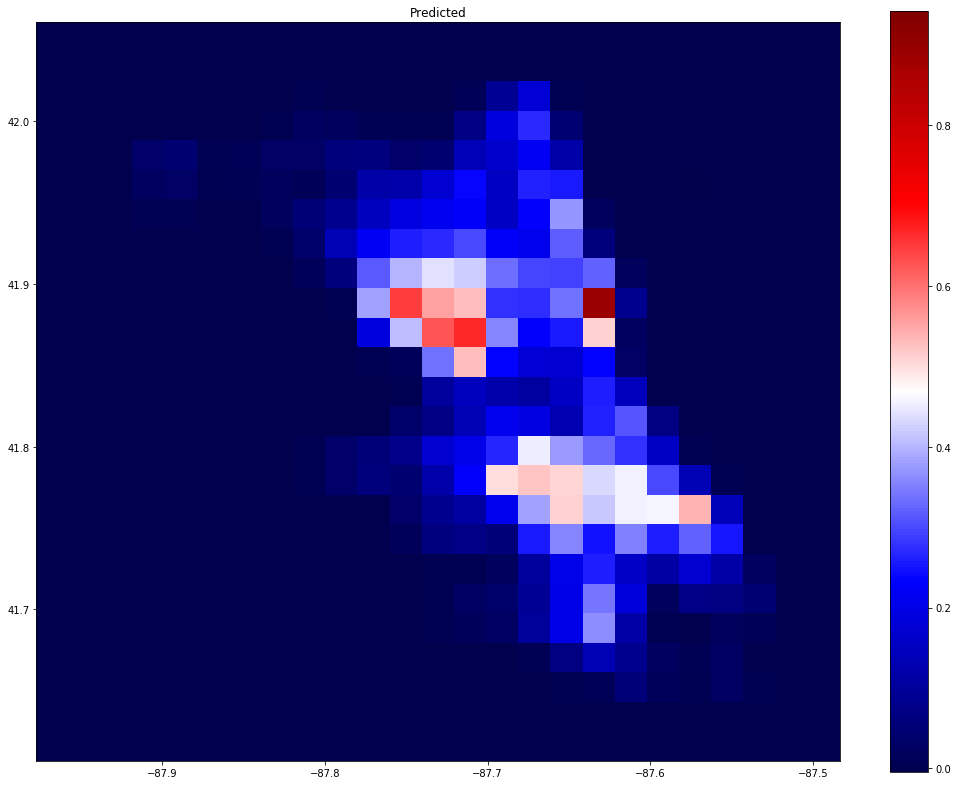

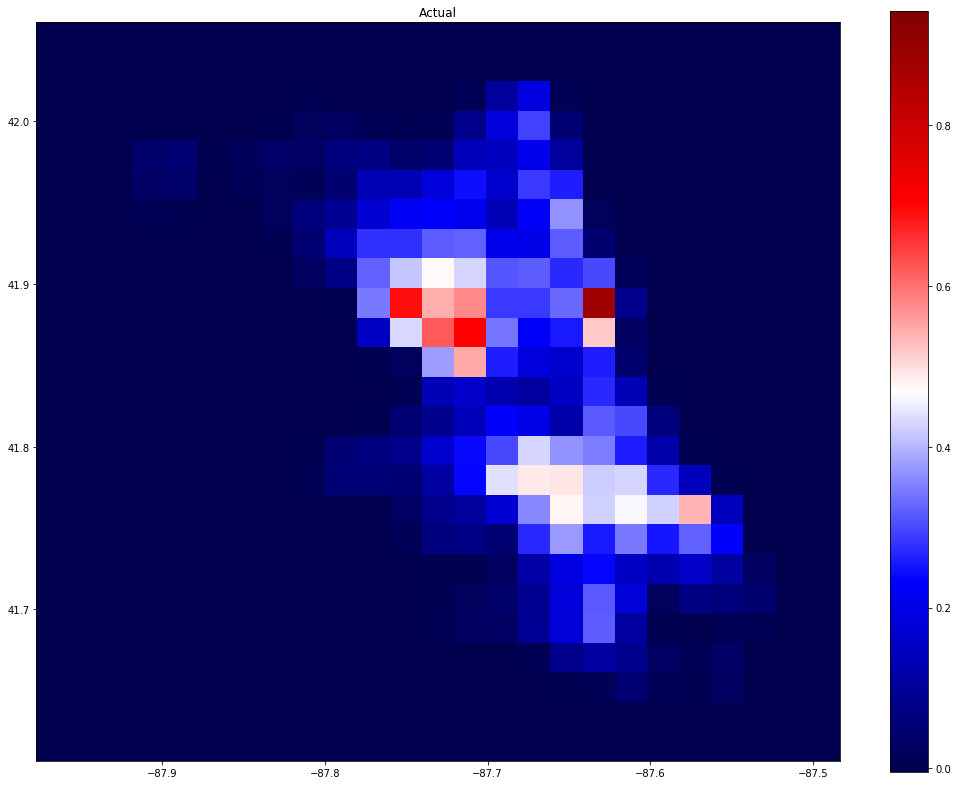

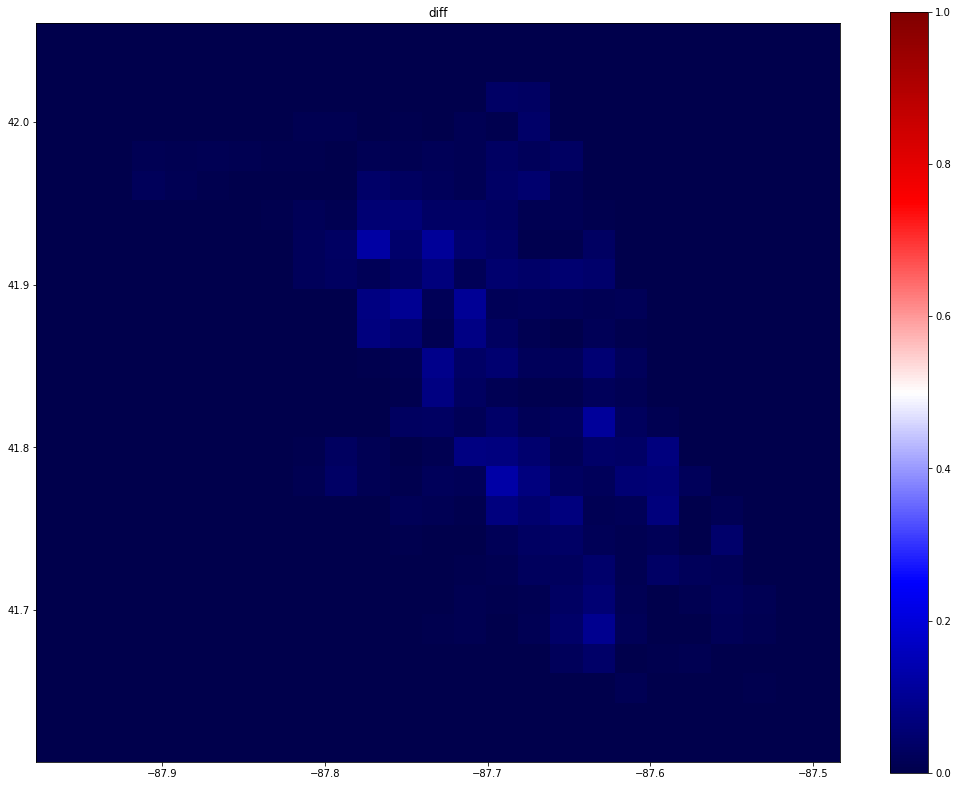

In [155]:
import matplotlib.pyplot as plt
grid_size = 500
density_matrix_t_series = []
# Define the borders
x = [-87.9361,-87.5245]
y = [41.6447,42.023]
deltaX = (max(x) - min(x))/10
deltaY = (max(y) - min(y))/10
xmin = min(x) - deltaX
xmax = max(x) + deltaX
ymin = min(y) - deltaY
ymax = max(y) + deltaY

for timeStepFromLast in range(Y_valid.shape[0]):
    plt.figure(figsize=(18, 14))
    plt.title('Predicted')
    plt.imshow( X=reshapePred(Predict,timeStepFromLast),vmax=vmax,vmin=vmin, cmap=plt.cm.seismic, extent=[xmin, xmax, ymin, ymax])
    plt.colorbar()
    
    plt.figure(figsize=(18, 14))
    plt.title('Actual')
    plt.imshow( X=reshapePred(Y_valid,timeStepFromLast ),vmax=vmax,vmin=vmin, cmap=plt.cm.seismic, extent=[xmin, xmax, ymin, ymax])
    plt.colorbar()
    
    diff = np.abs(reshapePred(Predict,timeStepFromLast)-reshapePred(Y_valid,timeStepFromLast ))
    plt.figure(figsize=(18, 14))
    plt.title('diff')
    plt.imshow( X=scaleDiff(diff,diff_max,diff_min),vmax=1,vmin=0, cmap=plt.cm.seismic, extent=[xmin, xmax, ymin, ymax])
    plt.colorbar()

#### We plot the single pixel with the most dense in crime KDE

In [282]:
Y_valid[:,i+1][1:]-Y_valid[:,i+1][0:-1]

array([-9.01753809e-04,  1.18319356e-02,  6.39541418e-03, -1.00963813e-03,
        2.21520226e-02,  9.82203294e-03,  8.98862978e-04, -1.40180189e-02,
       -2.85536782e-02, -1.55400392e-02,  2.49836335e-03, -6.25528683e-03,
        6.57367428e-03,  1.52411820e-02, -4.17035312e-03, -3.49904935e-03,
        1.69208642e-02, -6.37871144e-03,  3.80110476e-03,  3.35229609e-02,
        6.12156350e-03,  4.98861189e-04,  3.92699759e-03, -6.97102683e-03,
       -8.97786049e-03,  1.45726198e-02,  3.08736283e-03, -5.16823240e-03,
        4.67295254e-03, -1.55889985e-02, -1.86007998e-02, -5.75143199e-03,
       -4.28169510e-03,  5.93364074e-03,  7.45896358e-03, -3.70727537e-04,
        1.66578132e-02, -1.82307174e-02,  1.18449802e-03,  6.59418153e-03,
       -1.84222292e-02, -1.27048644e-02,  9.62644994e-03, -7.42424322e-03,
        6.96875199e-03,  2.01487532e-02,  3.60732578e-03,  2.75561154e-03,
       -5.55466216e-03, -1.54981214e-02, -1.23346509e-02,  3.42596063e-03,
        1.33056411e-02, -

In [283]:
[Y_valid[:,i+1][1:]-Y_valid[:,i+1][0:-1]
 ,Y_valid[:,i+1][1:]-Y_valid[:,i+1][0:-1]]

[array([-9.01753809e-04,  1.18319356e-02,  6.39541418e-03, -1.00963813e-03,
         2.21520226e-02,  9.82203294e-03,  8.98862978e-04, -1.40180189e-02,
        -2.85536782e-02, -1.55400392e-02,  2.49836335e-03, -6.25528683e-03,
         6.57367428e-03,  1.52411820e-02, -4.17035312e-03, -3.49904935e-03,
         1.69208642e-02, -6.37871144e-03,  3.80110476e-03,  3.35229609e-02,
         6.12156350e-03,  4.98861189e-04,  3.92699759e-03, -6.97102683e-03,
        -8.97786049e-03,  1.45726198e-02,  3.08736283e-03, -5.16823240e-03,
         4.67295254e-03, -1.55889985e-02, -1.86007998e-02, -5.75143199e-03,
        -4.28169510e-03,  5.93364074e-03,  7.45896358e-03, -3.70727537e-04,
         1.66578132e-02, -1.82307174e-02,  1.18449802e-03,  6.59418153e-03,
        -1.84222292e-02, -1.27048644e-02,  9.62644994e-03, -7.42424322e-03,
         6.96875199e-03,  2.01487532e-02,  3.60732578e-03,  2.75561154e-03,
        -5.55466216e-03, -1.54981214e-02, -1.23346509e-02,  3.42596063e-03,
         1.3

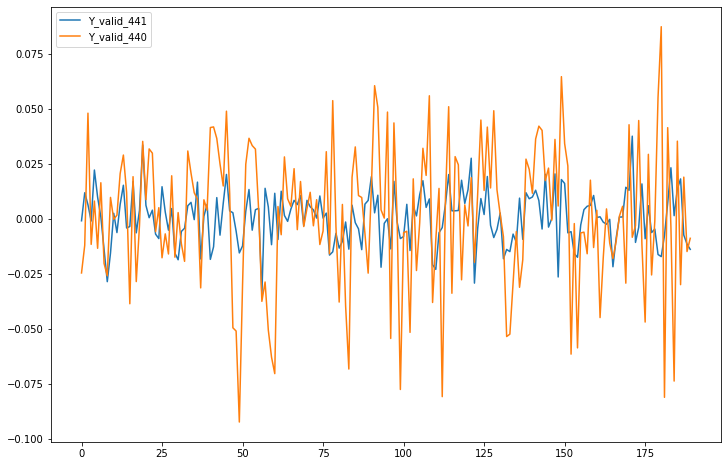

In [284]:
pd.DataFrame(np.transpose(np.vstack([Y_valid[:,i+1][1:]-Y_valid[:,i+1][0:-1],Y_valid[:,i][1:]-Y_valid[:,i][0:-1]])),columns=["Y_valid_"+str(i+1),"Y_valid_"+str(i)]).plot(figsize=(12,8))

In [182]:
for i in range(Predict.shape[0]-1):
    diff_ts = Predict[i,:] - Predict[i+1,:]
    print(np.sum(diff_ts[np.argsort(diff_ts)]))

-0.018348634
-0.016021848
0.015775248
0.020925283
0.045273706
0.03128943
0.018040925
-0.00502263
-0.02631709
-0.013405532
-0.0017083734
-0.013218492
0.0045014173
0.017989665
0.009978518
0.008973703
0.014333576
-0.0049110055
-0.020244107
-0.022466868
-0.040362597
-0.045676887
-0.024351493
0.019487843
0.04735197
0.0633508
0.053164914
0.013827905
-0.019466996
-0.028476924
-0.0130241215
0.02217567
0.04528658
0.046599343
0.03545305
0.0024482757
-0.01050134
-0.009597987
0.004566729
-0.008940145
-0.00509423
-0.005364269
-0.010164425
-0.015671536
-0.0077869743
-0.01051566
-0.049754962
-0.04241468
-0.028206766
-0.0001823008
0.07727072
0.061968148
0.01799655
-0.047201604
-0.07962313
-0.08635062
-0.01418215
0.005559683
0.053069443
0.056287825
0.03908366
-0.0066076815
-0.024781823
-0.035811573
-0.016936183
-0.00874117
0.021601647
0.0020243526
-0.0074737966
-0.008401036
-0.0012931526
0.028078198
0.038011193
0.017500311
0.005063951
-0.025907993
-0.036359817
-0.050627694
0.0023586303
-0.010886669
0.0

#### We plot the difference between prediction and target

In [183]:
diff = (reshapePred(Y_valid,3)-reshapePred(Predict,3))
diff.shape

(25, 25)

In [184]:
diff_max = np.max(diff)
diff_min = np.min(diff)
scaled_diff = (diff - diff_min)/(diff_max - diff_min)

In [185]:
np.max(scaled_diff)

1.0

In [186]:
diff

array([[-1.67235569e-03, -3.23733548e-04,  5.95766352e-04,
        -1.37537951e-04,  1.76841160e-04, -3.81134800e-04,
         2.69784126e-04,  1.77089707e-04,  1.05850736e-03,
         9.53653420e-04,  3.19143641e-04, -2.29958678e-05,
        -2.26227596e-04, -7.21998978e-04,  7.96711422e-04,
         1.71949388e-04,  3.67081026e-04, -2.15561362e-04,
         2.58697488e-04,  5.21506066e-04, -5.16083091e-05,
        -9.78268217e-04, -9.02256346e-04, -1.38947275e-03,
         7.24554178e-04],
       [ 2.90377066e-04,  7.12244539e-04, -4.19916818e-04,
         1.67926308e-04,  9.38627461e-04, -3.83002101e-04,
        -8.67697876e-04, -8.38714186e-06,  8.89419112e-04,
        -3.53584765e-05,  2.69406009e-05, -4.64310055e-04,
         5.50329569e-05, -1.67888240e-03,  1.70630403e-04,
        -2.00605951e-04,  1.23288529e-03, -1.12075359e-05,
         4.61907068e-04, -1.61501090e-03,  3.22510488e-04,
         7.08120642e-04,  1.06346037e-03,  3.36882658e-05,
        -1.00405794e-03],
    

In [187]:
vmax, vmin = np.max(scaled_diff), np.min(scaled_diff)

In [188]:
vmax, vmin 

(1.0, 0.0)

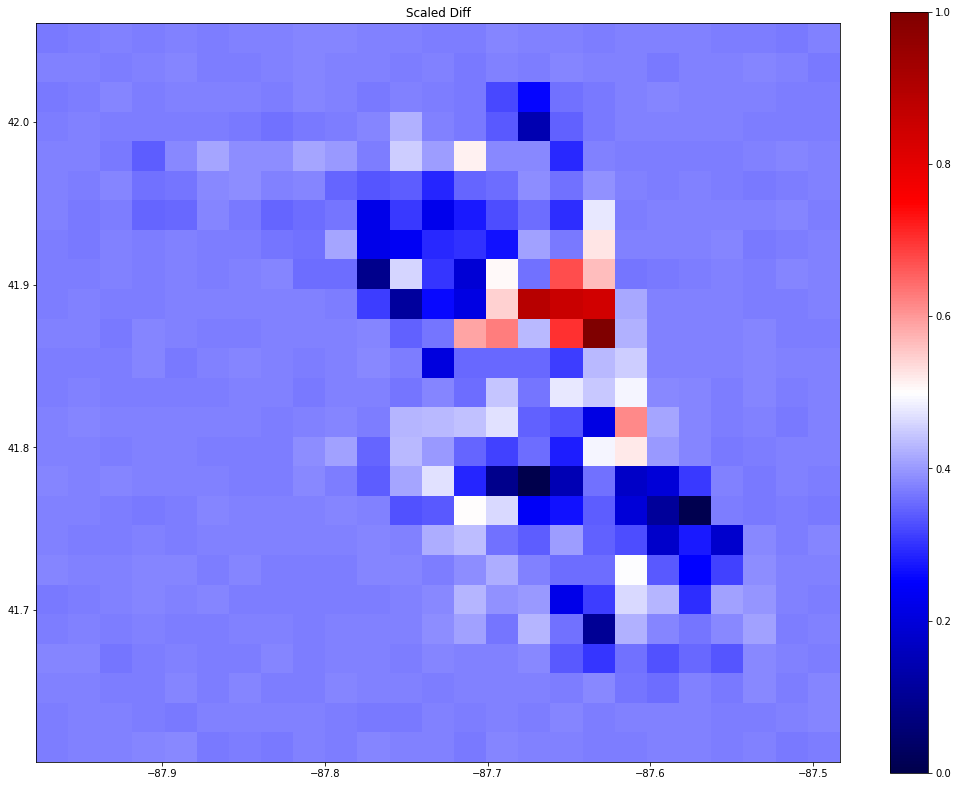

In [190]:
plt.figure(figsize=(18, 14))
plt.title('Scaled Diff')
plt.imshow( X=scaled_diff,vmax=vmax, vmin=vmin, cmap=plt.cm.seismic, extent=[xmin, xmax, ymin, ymax])
plt.colorbar()

#### Note the differences is scaled, red means extreme differences inplot above. Interestingly we see the extreme differences is at the highest crime areas.